# Audio Processing: Week 2 – Loudness, Normalization & Dynamics Processing

Minggu ini kita akan fokus pada kontrol amplitudo: mengukur loudness, normalisasi audio, dan dynamics processing.

## Tujuan Pembelajaran:

- **Memahami konsep fundamental** *loudness*: Peak, RMS, dan LUFS
- **Mengukur *loudness* audio** menggunakan NumPy dan pustaka `pyloudnorm`
- **Menerapkan kontrol volume** *fade in/out* dan *crossfade* untuk transisi
- **Menguasai *dynamics processing*** kompresor dan *noise gate*
- **Mendeteksi dan memotong** bagian hening (*silence*) secara otomatis
- **Membangun rantai pemrosesan** audio lengkap

## Aplikasi di Dunia Nyata:

- **Music Production & Streaming**: Mastering untuk standar platform (-14 LUFS Spotify)
- **Broadcasting & Podcasting**: Level kontrol dan noise gate untuk clarity
- **Post-Production Film & Video**: Balance dialog, musik, dan efek suara
- **Game Development**: Normalisasi dialog dan efek suara secara batch
- **Audio Archiving & Restoration**: Cleanup dan trimming otomatis

**File Audio:** Kita akan menggunakan audio yang telah anda miliki sebelumnya

In [1]:
# Setup & Import Libraries
# Pastikan semua library terinstal: pip install librosa soundfile numpy scipy pyloudnorm pydub matplotlib ipython

# Cek apakah pyloudnorm sudah terinstall
try:
    import pyloudnorm as pyln
except ImportError:
    print("❌ pyloudnorm belum terinstall")

# Cek apakah pydub sudah terinstall
try:
    import pydub
except ImportError:
    print("❌ pydub belum terinstall")

import librosa
import soundfile as sf
import numpy as np
import scipy.signal
import matplotlib.pyplot as plt
from IPython.display import Audio
import os
import warnings
import pyloudnorm as pyln

# Filter warnings untuk output yang lebih bersih
warnings.filterwarnings('ignore')

# Set style plot untuk visualisasi yang lebih menarik
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.3

# Tampilkan versi pustaka
print("🔧 SETUP PUSTAKA")
print("=" * 40)
print(f"Librosa: {librosa.__version__}")
print(f"NumPy: {np.__version__}")
print(f"SciPy: {scipy.__version__}")
print(f"Matplotlib: {plt.matplotlib.__version__}")
print(f"SoundFile: {sf.__version__}")
print("✅ Semua pustaka berhasil dimuat!")
print()

🔧 SETUP PUSTAKA
Librosa: 0.11.0
NumPy: 2.2.6
SciPy: 1.15.3
Matplotlib: 3.10.6
SoundFile: 0.13.1
✅ Semua pustaka berhasil dimuat!



## Konsep Loudness

**Loudness** adalah persepsi subjektif terhadap intensitas suara yang didengar oleh manusia. 

### Peak (dBFS), RMS, LUFS (perceived loudness)
Dalam audio digital, ada beberapa jenis pengukuran Loudness yang umum digunakan:

- **Peak (dBFS)**  
  Nilai amplitudo tertinggi pada sinyal audio, diukur relatif terhadap *Full Scale* (0 dBFS = maksimum digital.Berguna untuk mencegah *clipping*.

- **RMS (Root Mean Square)**  
  Rata-rata energi sinyal audio dalam jangka waktu tertentu. Diukur dengan satuan dBFS dan nilainya lebih stabil daripada peak.

- **LUFS (Loudness Units relative to Full Scale)**  
  Metrik yang meniru persepsi pendengaran manusia (*perceived loudness*). Digunakan sebagai standar industri.

### Mengapa Normalization Penting?

Normalisasi adalah proses menyesuaikan gain audio sehingga levelnya sesuai target tertentu (misalnya, puncak mendekati 0 dBFS atau rata-rata sesuai -14 LUFS).  

Tanpa normalisasi, level antar file/audio tidak konsisten. Normalisasi membantu menjaga volume seragam di berbagai konteks (musik, podcast, atau siaran).


## Pengukuran Loudness

Loudness measurement adalah proses mengukur seberapa keras sinyal audio terdengar dengan berbagai metrik (Peak, RMS, LUFS).

### Peak & RMS Dengan NumPy

- **Peak (dBFS)**: Amplitudo tertinggi dalam sinyal, relatif terhadap 0 dBFS.
- **RMS (Root Mean Square)**: Rata-rata energi sinyal, mencerminkan tingkat loudness yang lebih konsisten.

Formula RMS:
- RMS = sqrt(mean(y^2))

Formula konversi Nilai Amplitudo ke dBFS:
- Peak (dBFS) = 20 * log10(Peak Amplitudo)
- RMS (dBFS) = 20 * log10(RMS Amplitudo)

🎵 AUDIO LOADED
✅ Berhasil memuat: i:\KULIAH\IF25-40305-handson\data\audio.wav
📊 Shape: (1529543,)
🎵 Sample rate: 24,000 Hz
⏱️ Durasi: 63.73 detik
📈 Amplitude range: -1.000 to 1.000

📏 Metrik Loudness:
🔊 Peak: 1.000 (0.00 dBFS)
📈 RMS:  0.116 (-18.69 dBFS)


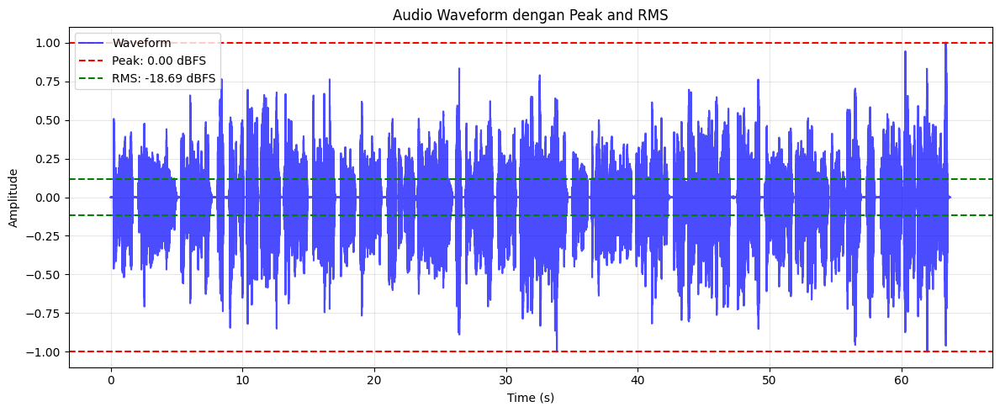

🔊 Audio Player:


In [2]:
import numpy as np
import librosa, os

# Memuat Audio (sama dengan Week 1)
PATH_AUDIO = os.path.join(os.getcwd(), 'data', 'audio.wav')

# Load audio dengan error handling
try:
    y, sr = librosa.load(PATH_AUDIO, sr=None)  # sr=None mempertahankan sample rate asli
    source_info = f"✅ Berhasil memuat: {PATH_AUDIO}"
except Exception as e:
    print(f"❌ Error loading audio: {e}")
    raise

# Konversi ke mono jika stereo
if y.ndim > 1:
    y = np.mean(y, axis=0)
    source_info += " - Dikonversi ke mono"

# Normalisasi dan konversi tipe data
y = y.astype(np.float32)

print("🎵 AUDIO LOADED")
print("=" * 40)
print(source_info)
print(f"📊 Shape: {y.shape}")
print(f"🎵 Sample rate: {sr:,} Hz")
print(f"⏱️ Durasi: {len(y)/sr:.2f} detik")
print(f"📈 Amplitude range: {y.min():.3f} to {y.max():.3f}")

# Normalisasi dan konversi tipe data
y = y.astype(np.float32)

# Hitung Nilai Peak (linear ke dBFS)
peak = np.max(np.abs(y))
peak_db = 20 * np.log10(peak)

# Hitung Nilai RMS (linear ke dBFS)
rms = np.sqrt(np.mean(y**2))
rms_db = 20 * np.log10(rms)

print("\n📏 Metrik Loudness:")
print(f"🔊 Peak: {peak:.3f} ({peak_db:.2f} dBFS)")
print(f"📈 RMS:  {rms:.3f} ({rms_db:.2f} dBFS)")

# Plot waveform dengan garis Peak dan RMS
plt.figure(figsize=(12, 5))
time = np.linspace(0, len(y) / sr, len(y))

plt.plot(time, y, label="Waveform", color='blue', alpha=0.7)
plt.axhline(peak, color='red', linestyle='--', label=f"Peak: {peak_db:.2f} dBFS")
plt.axhline(-peak, color='red', linestyle='--')
plt.axhline(rms, color='green', linestyle='--', label=f"RMS: {rms_db:.2f} dBFS")
plt.axhline(-rms, color='green', linestyle='--')
plt.title("Audio Waveform dengan Peak and RMS")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Audio player
print("🔊 Audio Player:")
display(Audio(y, rate=sr))

### LUFS dengan pyloudnorm

- LUFS (Loudness Units relative to Full Scale) adalah standar untuk mengukur kenyaringan audio sesuai persepsi manusia.  
- LUFS memperhitungkan sensitivitas telinga terhadap frekuensi tertentu dan durasi pendengaran.  

In [3]:
import pyloudnorm as pyln

# Meter untuk loudness
meter = pyln.Meter(sr)  # default K-weighting
lufs = meter.integrated_loudness(y)

print(f"LUFS (Integrated Loudness): {lufs:.2f} LUFS")

LUFS (Integrated Loudness): -19.04 LUFS


### Target Loudness Standar Industri

- **Broadcast (TV/Radio)**: rata-rata **-23 LUFS**  
- **Streaming (Spotify, YouTube, Apple Music)**: rata-rata **-14 LUFS**  

## Gain & Volume Control

Pengendalian gain dan volume memungkinkan kita menyesuaikan level audio, membuat transisi halus, dan menggabungkan beberapa klip secara konsisten.

### Adjusting Gain (dB / Linear)

- Gain bisa dinyatakan dalam **skala linear** (perkalian langsung dengan amplitudo) atau **skala dB**.  
- Rumus konversi:  
$$\text{linear} = 10^{\frac{\text{dB}}{20}}$$
- Contoh: menaikkan gain +6 dB ≈ menggandakan amplitudo sinyal.


In [4]:
import numpy as np
import librosa, os
import pyloudnorm as pyln
from IPython.display import Audio, display
import matplotlib.pyplot as plt

# Load audio
PATH_AUDIO = os.path.join(os.getcwd(), 'data', 'audio.wav')
y, sr = librosa.load(PATH_AUDIO, sr=None)

# Helper: kalkulasi loudness
def peak_dbfs(sig):
    p = np.max(np.abs(sig))
    return p, 20*np.log10(p + 1e-12)

def rms_dbfs(sig):
    r = np.sqrt(np.mean(sig**2))
    return r, 20*np.log10(r + 1e-12)

def lufs_value(sig, sr):
    meter = pyln.Meter(sr)
    return meter.integrated_loudness(sig)

# Ukur Loudness sebelum gain
peak_val_before, peak_before_db = peak_dbfs(y)
rms_val_before, rms_before_db   = rms_dbfs(y)
lufs_before = lufs_value(y, sr)

# Fungsi Gain Adjustment
def adjust_gain(audio_data, gain_db=8.0):
    gain_linear = 10 ** (gain_db / 20.0)
    adjusted_audio = audio_data * gain_linear
    adjusted_audio = np.clip(adjusted_audio, -1.0, 1.0) # Clip to prevent amplitude overflow
    return adjusted_audio

gain_db = 8.0
y_gain = adjust_gain(y, gain_db)   

# Ukur Loudness sesudah gain
peak_val_after, peak_after_db = peak_dbfs(y_gain)
rms_val_after, rms_after_db   = rms_dbfs(y_gain)
lufs_after = lufs_value(y_gain, sr)

# Print ringkas
print(f"✅ Gain applied: {gain_db:+.1f} dB (linear factor {gain_linear:.3f})\n")
print("Loudness (Before → After):")
print(f"  • Peak: {peak_before_db:6.2f} dBFS  → {peak_after_db:6.2f} dBFS")
print(f"  • RMS : {rms_before_db:6.2f} dBFS  → {rms_after_db:6.2f} dBFS")
print(f"  • LUFS: {lufs_before:6.2f} LUFS  → {lufs_after:6.2f} LUFS")

# Plot perbandingan waveform - durasi penuh
t_full = np.linspace(0, len(y)/sr, len(y), endpoint=False)

plt.figure(figsize=(12, 4))
plt.plot(t_full, y, label="Before Gain", color="black", alpha=0.7, linewidth=0.8)
plt.plot(t_full, y_gain, label=f"After Gain ({gain_db:+.1f} dB)", color="blue", alpha=0.7, linewidth=0.8)

# Labels
plt.title("Waveform Comparison - Full Duration")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True, alpha=0.3)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

# Plot zoomed view - first 5 seconds
duration_zoom = 5.0
samples_zoom = int(duration_zoom * sr)
t_zoom = np.linspace(0, duration_zoom, samples_zoom)

plt.figure(figsize=(12, 4))
plt.plot(t_zoom, y[:samples_zoom], label="Before Gain", color="black", alpha=0.7, linewidth=1.0)
plt.plot(t_zoom, y_gain[:samples_zoom], label=f"After Gain ({gain_db:+.1f} dB)", color="blue", alpha=0.7, linewidth=1.0)

plt.title("Waveform Comparison - Zoomed View (First 5 seconds)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True, alpha=0.3)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

# Display audio players for comparison
print("\n🔊 Audio Comparison:")
print("=" * 40)

print("🎵 BEFORE Gain Adjustment:")
display(Audio(y, rate=sr))

print(f"\n🎵 AFTER Gain Adjustment (+{gain_db} dB):")
display(Audio(y_gain, rate=sr))

print("Perhatikan perubahan loudness pada audio setelah penyesuaian gain.")

NameError: name 'gain_linear' is not defined

### Fade In & Fade Out

- **Fade In**: meningkatkan volume perlahan dari 0 hingga normal.  
- **Fade Out**: menurunkan volume perlahan hingga senyap.  
- Bisa berbentuk **linear** atau **eksponensial** untuk hasil berbeda.

In [ ]:
import os, numpy as np, librosa, matplotlib.pyplot as plt
from IPython.display import Audio, display

PATH_AUDIO = os.path.join(os.getcwd(), 'data', 'audio.wav')
y, sr = librosa.load(PATH_AUDIO, sr=None)

def linear_fade(audio, sr, ms=2000):
    N = min(int(ms/1000 * sr), len(audio)//2)
    fin  = np.linspace(0.0, 1.0, N)
    fout = np.linspace(1.0, 0.0, N)
    out = audio.copy()
    out[:N]  *= fin
    out[-N:] *= fout
    return out, fin, fout, N

"""
Membuat fade in/out eksponensial pada audio.
alpha = 1.0: fade linear (sama dengan linear_fade)
alpha > 1.0: fade lebih cepat di awal, lebih lambat di akhir (fade in yang natural)
alpha < 1.0: fade lebih lambat di awal, lebih cepat di akhir (fade out yang natural)
"""
def exp_fade(audio, sr, ms=2000, alpha=3.0):
    N = min(int(ms/1000 * sr), len(audio)//2)
    x = np.linspace(0.0, 1.0, N)
    fin  = x**alpha
    fout = (1.0 - x)**alpha
    out = audio.copy()
    out[:N]  *= fin
    out[-N:] *= fout
    return out, fin, fout, N, alpha

fade_ms = 2000
y_lin, fin_lin, fout_lin, N_lin = linear_fade(y, sr, fade_ms)
y_exp, fin_exp, fout_exp, N_exp, alpha = exp_fade(y, sr, fade_ms, alpha=3.0)

L = min(len(y), int(sr * 6.0))
t = np.linspace(0, L/sr, L, endpoint=False)

plt.figure(figsize=(12, 8))
plt.plot(t, y[:L],     label="Asli", linewidth=0.9, alpha=0.6)
plt.plot(t, y_lin[:L], label="Linear", linewidth=0.9)
plt.plot(t, y_exp[:L], label="Eksponensial", linewidth=0.9)
plt.title("Waveform — Asli vs Linear vs Eksponensial (6s)")
plt.xlabel("Waktu (s)")
plt.ylabel("Amplitudo")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

N = min(N_lin, N_exp)
t_env = np.arange(N)/sr

plt.figure(figsize=(12, 6))
plt.plot(t_env, fin_lin[:N],  label="Fade-In Linear", linewidth=1.4)
plt.plot(t_env, fin_exp[:N],  label=f"Fade-In Eksponensial (α={alpha})", linewidth=1.4)
plt.plot(t_env, fout_lin[:N], label="Fade-Out Linear", linestyle="--", linewidth=1.4)
plt.plot(t_env, fout_exp[:N], label=f"Fade-Out Eksponensial (α={alpha})", linestyle="--", linewidth=1.4)
plt.title(f"Envelope — Linear vs Eksponensial ({fade_ms/1000:.1f}s)")
plt.xlabel("Waktu (s)")
plt.ylabel("Gain")
plt.ylim(-0.05, 1.05)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

print("🔊 Audio Comparison:")
print("=" * 40)

print("🎵 Original Audio:")
print("   Audio asli tanpa efek fade")
display(Audio(y, rate=sr))

print("\n🎵 Linear Fade:")
print(f"   Fade in/out linear {fade_ms}ms")
display(Audio(y_lin, rate=sr))

print("\n🎵 Exponential Fade:")
print(f"   Fade in/out eksponensial {fade_ms}ms (α={alpha})")
display(Audio(y_exp, rate=sr))


### Crossfades

**Crossfade** menyatukan dua klip tumpang tindih secara halus. Volume akhir klip pertama diturunkan (fade-out), volume awal klip kedua dinaikkan (fade-in), sehingga transisi terdengar halus.

In [ ]:
import os, numpy as np, librosa, matplotlib.pyplot as plt
from IPython.display import Audio, display

# load dua file
PATH_A = os.path.join(os.getcwd(), 'data', 'audio.wav')
PATH_B = os.path.join(os.getcwd(), 'data', 'artorias.wav')
a, sr_a = librosa.load(PATH_A, sr=None)
b, sr_b = librosa.load(PATH_B, sr=None)

# samakan sample rate
if sr_b != sr_a:
    b = librosa.resample(b, orig_sr=sr_b, target_sr=sr_a)
    sr_b = sr_a
sr = sr_a

def crossfade(a: np.ndarray, b: np.ndarray, sr: int, dur_sec: float = 1.0):
    N = min(int(dur_sec * sr), len(a), len(b))
    fade_out_a = np.linspace(1.0, 0.0, N)
    fade_in_b = np.linspace(0.0, 1.0, N)
    result = np.concatenate([a[:-N], a[-N:] * fade_out_a + b[:N] * fade_in_b, b[N:]])
    return result, fade_out_a, fade_in_b, N

y_cross, fade_out, fade_in, N = crossfade(a, b, sr, dur_sec=1.0)

# Print timing information
start_time_a = (len(a) - N) / sr
end_time_a = len(a) / sr
print(f"\n⏱️ Crossfade Timing Information:")
print(f"   • Crossfade duration: {N/sr:.2f} seconds ({N:,} samples)")
print(f"   • Crossfade Time: {start_time_a:.2f}s - {end_time_a:.2f}s")
print(f"   • Total result length: {len(y_cross)/sr:.2f}s")

print("\n🎵 Crossfaded Result ({start_time_a:.2f}) :")
display(Audio(y_cross, rate=sr))

## Dynamics Processing

**Dynamics processing** adalah teknik untuk memanipulasi rentang dinamis audio, yaitu perbedaan antara bagian terpelan dan terkeras

### Compression

**Compression** adalah teknik untuk mengurangi volume sinyal ketika suaranya terlalu keras. **Compressor** adalah alat yang menerapkan kompresi ini secara otomatis. Ada 4 parameter umum kompresor:

- **Threshold** adalah ambang batas volume (dalam dB) yang jika dilewati akan mengaktifkan kompresor.
- **Ratio** menentukan seberapa kuat kompresor bekerja. Contohnya rasio 4:1 berarti sinyal 4 dB di atas threshold akan dikompres menjadi 1dB.
- **Attack** adalah waktu yang dibutuhkan kompresor untuk mulai bekerja setelah sinyal melewati threshold.
- **Release** adalah waktu yang dibutuhkan kompresor untuk berhenti bekerja setelah sinyal kembali turun di bawah threshold.

In [6]:
# Fungsi Kompressor 
def audio_compression(audio_data, threshold_db=-20.0, ratio=4.0, attack_ms=5.0, release_ms=50.0):
    # Convert to linear amplitude
    threshold = 10 ** (threshold_db / 20.0)
    
    # Calculate attack and release coefficients
    attack_coef = np.exp(-1.0 / (sr * attack_ms / 1000.0))
    release_coef = np.exp(-1.0 / (sr * release_ms / 1000.0))
    
    # Initialize the envelope
    envelope = np.zeros_like(audio_data)
    gain = np.ones_like(audio_data)
    
    # Apply compression
    for i in range(len(audio_data)):
        # Calculate envelope using peak detection
        current_amplitude = np.abs(audio_data[i])
        if i == 0:
            envelope[i] = current_amplitude
        else:
            if current_amplitude > envelope[i-1]:  # Attack phase
                envelope[i] = attack_coef * envelope[i-1] + (1 - attack_coef) * current_amplitude
            else:  # Release phase
                envelope[i] = release_coef * envelope[i-1] + (1 - release_coef) * current_amplitude
        
        # Calculate gain reduction
        if envelope[i] > threshold:
            slope = (1 - 1/ratio)
            gain_reduction_db = slope * (20 * np.log10(envelope[i]) - threshold_db)
            gain[i] = 10 ** (-gain_reduction_db / 20.0)
        else:
            gain[i] = 1.0
    
    # Apply gain to the audio
    compressed_audio = audio_data * gain
    return compressed_audio

In [12]:
# Kompres audio
PATH_A = os.path.join(os.getcwd(), 'data', 'audio.wav') 
a, sr_a = librosa.load(PATH_A, sr=None)

compressed_audio = audio_compression(a, threshold_db=-20.0, ratio=4.0, attack_ms=5.0, release_ms=50.0)


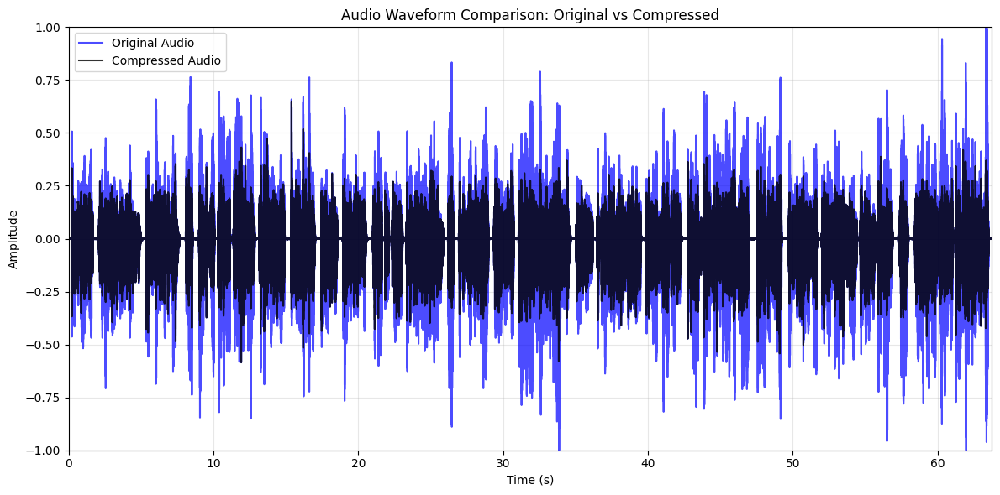

🔊 Audio Comparison:
🎵 Original Audio:



🎵 Compressed Audio:


In [13]:
# Visualisasi hasil kompresi
plt.figure(figsize=(12, 6))

# Time axis for visualization
time_axis = np.linspace(0, len(a) / sr, len(a))

# Plot both waveforms on the same subplot
plt.plot(time_axis, a, color='blue', label='Original Audio', alpha=0.7)
plt.plot(time_axis, compressed_audio, color='black', label='Compressed Audio', alpha=0.8)

plt.title('Audio Waveform Comparison: Original vs Compressed')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(alpha=0.3)
plt.xlim(0, len(a)/sr)
plt.ylim(-1, 1)
plt.legend()
plt.tight_layout()
plt.show()

# Audio comparison
print("🔊 Audio Comparison:")
print("=" * 40)

print("🎵 Original Audio:")
display(Audio(a, rate=sr))

print("\n🎵 Compressed Audio:")
display(Audio(compressed_audio, rate=sr))


### Limiting vs Compression

Limiting adalah teknik untuk menghentikan sinyal yang melebihi threshold secara paksa. Limiting dapat dianggap sebagai kompresi dengan rasio yang sangat tinggi.

Tujuan:
- Limiter: Untuk melindungi suara dengan mencegah level puncak melampaui batas.
- Compressor: Untuk membentuk suara dengan meratakan rentang dinamis, membuat bagian yang pelan lebih terdengar dan yang keras lebih terkontrol.

Ratio:
- Limiter: sangat tinggi (misalnya, 20:1 hingga tak terhingga ∞:1) untuk menghentikan sinyal secara paksa.
- Compressor: rendah hingga sedang (misalnya, 2:1 atau 4:1) untuk pengurangan volume yang lebih halus.

In [35]:
# Fungsi Limiter
def audio_limiter(audio_data, threshold_db=-6.0, attack_ms=0.1, release_ms=10.0):
    # Convert threshold to linear amplitude
    threshold = 10 ** (threshold_db / 20.0)
    
    # Calculate attack and release coefficients (very fast attack for limiter)
    attack_coef = np.exp(-1.0 / (sr * attack_ms / 1000.0))
    release_coef = np.exp(-1.0 / (sr * release_ms / 1000.0))
    
    # Initialize the envelope and gain
    envelope = np.zeros_like(audio_data)
    gain = np.ones_like(audio_data)
    
    # Apply limiting with very high ratio (∞:1)
    for i in range(len(audio_data)):
        # Calculate envelope using peak detection
        current_amplitude = np.abs(audio_data[i])
        if i == 0:
            envelope[i] = current_amplitude
        else:
            if current_amplitude > envelope[i-1]:  # Attack phase
                envelope[i] = attack_coef * envelope[i-1] + (1 - attack_coef) * current_amplitude
            else:  # Release phase
                envelope[i] = release_coef * envelope[i-1] + (1 - release_coef) * current_amplitude
        
        # Apply limiting (infinite ratio - hard ceiling)
        if envelope[i] > threshold:
            gain[i] = threshold / envelope[i]  # Hard limit to threshold
        else:
            gain[i] = 1.0
    
    # Apply gain to the audio
    limited_audio = audio_data * gain
    return limited_audio

In [36]:
# Limit audio
PATH_A = os.path.join(os.getcwd(), 'data', 'audio.wav') 
a, sr_a = librosa.load(PATH_A, sr=None)

# Apply limiter to the audio
threshold_db=-20.0
compressed_audio = audio_compression(a, threshold_db=threshold_db, ratio=4.0, attack_ms=5.0, release_ms=50.0)
limited_audio = audio_limiter(a, threshold_db=threshold_db, attack_ms=0.1, release_ms=10.0)

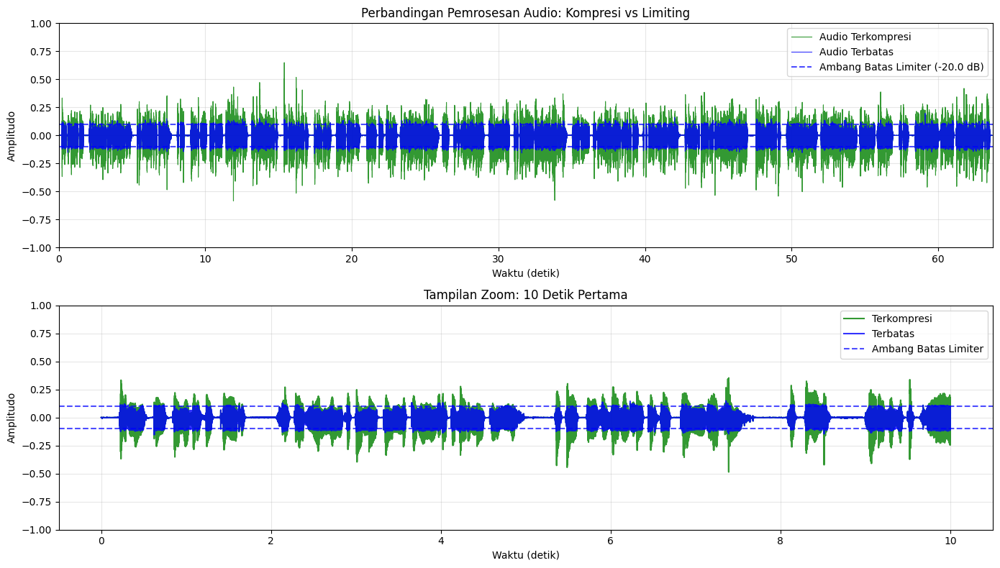

📊 PERBANDINGAN METRIK LOUDNESS
Metrik       Terkompresi  Terbatas    
--------------------------------------------------
Peak (dBFS)     -3.75        -14.12
RMS (dBFS)     -23.34        -27.23
LUFS           -23.71        -27.66

🔊 PERBANDINGAN AUDIO:
🎵 Audio Terkompresi (rasio 4:1, ambang batas -20.0dB):



🎵 Audio Terbatas (rasio ∞:1, ambang batas -20.0dB):



💡 CATATAN:
• Kompresor: Mengurangi rentang dinamis secara halus
• Limiter: Batas keras pada -20.0dB, mencegah clipping
• Audio terbatas tidak boleh melebihi ambang batas -20.0dB


In [37]:
# Visualisasi perbandingan Terkompresi dan Terbatas
plt.figure(figsize=(14, 8))

# Time axis for visualization
time_axis = np.linspace(0, len(a) / sr, len(a))

# Plot 1: Waveform penuh
plt.subplot(2, 1, 1)
plt.plot(time_axis, compressed_audio, color='green', label='Audio Terkompresi', alpha=0.8, linewidth=0.8)
plt.plot(time_axis, limited_audio, color='blue', label='Audio Terbatas', alpha=0.8, linewidth=0.8)
plt.axhline(y=10**(threshold_db/20.0), color='blue', linestyle='--', alpha=0.7, label=f'Ambang Batas Limiter ({threshold_db} dB)')
plt.axhline(y=-10**(threshold_db/20.0), color='blue', linestyle='--', alpha=0.7)
plt.title('Perbandingan Pemrosesan Audio: Kompresi vs Limiting')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.grid(alpha=0.3)
plt.legend()
plt.xlim(0, len(a)/sr)
plt.ylim(-1, 1)

# Plot 2: Tampilan zoom (10 detik pertama)
zoom_duration = 10.0
zoom_samples = int(zoom_duration * sr)
t_zoom = np.linspace(0, zoom_duration, zoom_samples)

plt.subplot(2, 1, 2)
plt.plot(t_zoom, compressed_audio[:zoom_samples], color='green', label='Terkompresi', alpha=0.8)
plt.plot(t_zoom, limited_audio[:zoom_samples], color='blue', label='Terbatas', alpha=0.8)
plt.axhline(y=10**(threshold_db/20.0), color='blue', linestyle='--', alpha=0.7, label='Ambang Batas Limiter')
plt.axhline(y=-10**(threshold_db/20.0), color='blue', linestyle='--', alpha=0.7)
plt.title('Tampilan Zoom: 10 Detik Pertama')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.grid(alpha=0.3)
plt.legend()
plt.ylim(-1, 1)

plt.tight_layout()
plt.show()

# Print perbandingan metrik loudness
def print_loudness_comparison():
    # Hitung metrik loudness untuk versi terkompresi dan terbatas
    peak_comp, peak_comp_db = peak_dbfs(compressed_audio)
    rms_comp, rms_comp_db = rms_dbfs(compressed_audio)
    lufs_comp = lufs_value(compressed_audio, sr)
    
    peak_lim, peak_lim_db = peak_dbfs(limited_audio)
    rms_lim, rms_lim_db = rms_dbfs(limited_audio)
    lufs_lim = lufs_value(limited_audio, sr)
    
    print("📊 PERBANDINGAN METRIK LOUDNESS")
    print("=" * 50)
    print(f"{'Metrik':<12} {'Terkompresi':<12} {'Terbatas':<12}")
    print("-" * 50)
    print(f"{'Peak (dBFS)':<12} {peak_comp_db:>8.2f}      {peak_lim_db:>8.2f}")
    print(f"{'RMS (dBFS)':<12} {rms_comp_db:>8.2f}      {rms_lim_db:>8.2f}")
    print(f"{'LUFS':<12} {lufs_comp:>8.2f}      {lufs_lim:>8.2f}")

print_loudness_comparison()

# Perbandingan audio
print("\n🔊 PERBANDINGAN AUDIO:")
print("=" * 40)

print(f"🎵 Audio Terkompresi (rasio 4:1, ambang batas {threshold_db}dB):")
display(Audio(compressed_audio, rate=sr))

print(f"\n🎵 Audio Terbatas (rasio ∞:1, ambang batas {threshold_db}dB):")
display(Audio(limited_audio, rate=sr))

print("\n💡 CATATAN:")
print("• Kompresor: Mengurangi rentang dinamis secara halus")
print(f"• Limiter: Batas keras pada {threshold_db}dB, mencegah clipping")
print(f"• Audio terbatas tidak boleh melebihi ambang batas {threshold_db}dB")


## Silence Detection

**Silence detection** adalah teknik untuk mengidentifikasi bagian audio yang tidak memiliki suara, memiliki amplitudo sangat rendah, atau hanya memiliki noise. Berguna untuk menghapus bagian yang tidak diperlukan dan mengoptimalkan file audio.

### Detect Long Silent Sections with Amplitude Thresholds

Deteksi bagian hening dilakukan dengan:
- **Threshold Amplitude**: Menetapkan batas amplitudo minimum (misal -40 dBFS)
- **Duration Threshold**: Menentukan durasi minimum untuk dianggap "silence" (misal 1 detik)
- **Window Analysis**: Menganalisis audio dalam blok kecil untuk mencari bagian yang konsisten di bawah threshold

Metode ini berguna untuk:
- Identifikasi jeda panjang dalam rekaman
- Deteksi pause antara track musik
- Analisis struktur audio (intro, outro, break)


In [ ]:
# Detect Long Silent Sections with Amplitude Thresholds

def detect_silence_sections(audio, sr, threshold_db=-40.0, min_duration_sec=1.0, frame_length=2048, hop_length=512):
    """
    Deteksi bagian hening dalam audio berdasarkan threshold amplitudo dan durasi minimum.
    
    Parameters:
    - audio: sinyal audio (numpy array)
    - sr: sample rate
    - threshold_db: ambang batas dalam dB (default -40 dB)
    - min_duration_sec: durasi minimum untuk dianggap silence (detik)
    - frame_length: panjang frame untuk analisis
    - hop_length: jarak antar frame
    
    Returns:
    - silence_segments: list of tuples (start_time, end_time) dalam detik
    - rms_db: RMS values dalam dB untuk visualisasi
    - times: time axis untuk visualisasi
    """
    
    # Hitung RMS untuk setiap frame
    rms = librosa.feature.rms(y=audio, frame_length=frame_length, hop_length=hop_length)[0]
    
    # Konversi ke dB (dengan handling untuk nilai 0)
    rms_db = 20 * np.log10(rms + 1e-12)  # tambah epsilon untuk menghindari log(0)
    
    # Buat time axis
    times = librosa.frames_to_time(np.arange(len(rms)), sr=sr, hop_length=hop_length)
    
    # Identifikasi frame yang di bawah threshold
    is_silence = rms_db < threshold_db
    
    # Cari segmen silence yang berkelanjutan
    silence_segments = []
    start_idx = None
    
    for i, silent in enumerate(is_silence):
        if silent and start_idx is None:
            # Mulai segmen silence baru
            start_idx = i
        elif not silent and start_idx is not None:
            # Akhir segmen silence
            duration = times[i-1] - times[start_idx]
            if duration >= min_duration_sec:
                silence_segments.append((times[start_idx], times[i-1]))
            start_idx = None
    
    # Handle jika audio berakhir dengan silence
    if start_idx is not None:
        duration = times[-1] - times[start_idx]
        if duration >= min_duration_sec:
            silence_segments.append((times[start_idx], times[-1]))
    
    return silence_segments, rms_db, times

# Deteksi silence pada audio
print("🔍 DETECTING SILENCE SECTIONS")
print("=" * 40)

threshold_db = -40.0
min_duration = 2.0  # minimum 2 detik untuk dianggap silence

silence_segments, rms_db, times = detect_silence_sections(
    a, sr, 
    threshold_db=threshold_db, 
    min_duration_sec=min_duration
)

print(f"🎚️ Threshold: {threshold_db} dB")
print(f"⏱️ Minimum duration: {min_duration} seconds")
print(f"📊 Found {len(silence_segments)} silence segments:")

for i, (start, end) in enumerate(silence_segments):
    duration = end - start
    print(f"   {i+1}. {start:.2f}s - {end:.2f}s (duration: {duration:.2f}s)")

# Visualisasi RMS dan deteksi silence
plt.figure(figsize=(14, 8))

# Plot 1: Waveform dengan marking silence segments
plt.subplot(2, 1, 1)
time_full = np.linspace(0, len(a)/sr, len(a))
plt.plot(time_full, a, color='blue', alpha=0.7, linewidth=0.5)

# Highlight silence segments
for start, end in silence_segments:
    plt.axvspan(start, end, color='red', alpha=0.3, label='Silence' if start == silence_segments[0][0] else "")

plt.title(f'Audio Waveform with Detected Silence Segments (>{min_duration}s, <{threshold_db}dB)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)
plt.legend()
plt.xlim(0, len(a)/sr)

# Plot 2: RMS dalam dB dengan threshold line
plt.subplot(2, 1, 2)
plt.plot(times, rms_db, color='green', linewidth=1.5, label='RMS (dB)')
plt.axhline(y=threshold_db, color='red', linestyle='--', linewidth=2, label=f'Threshold ({threshold_db} dB)')

# Highlight silence segments di plot RMS
for start, end in silence_segments:
    start_idx = np.argmin(np.abs(times - start))
    end_idx = np.argmin(np.abs(times - end))
    plt.fill_between(times[start_idx:end_idx+1], 
                    rms_db[start_idx:end_idx+1], 
                    threshold_db, 
                    color='red', alpha=0.4)

plt.title('RMS Energy Analysis with Silence Detection')
plt.xlabel('Time (s)')
plt.ylabel('RMS (dB)')
plt.grid(True, alpha=0.3)
plt.legend()
plt.xlim(0, times[-1])
plt.ylim(threshold_db - 10, np.max(rms_db) + 5)

plt.tight_layout()
plt.show()

# Statistik silence
if silence_segments:
    total_silence = sum([end - start for start, end in silence_segments])
    total_duration = len(a) / sr
    silence_percentage = (total_silence / total_duration) * 100
    
    print(f"\n📈 SILENCE STATISTICS:")
    print(f"   • Total audio duration: {total_duration:.2f}s")
    print(f"   • Total silence duration: {total_silence:.2f}s")
    print(f"   • Silence percentage: {silence_percentage:.1f}%")
    print(f"   • Average silence segment: {total_silence/len(silence_segments):.2f}s")
else:
    print(f"\n📈 No silence segments found with current settings.")
    print(f"   Try lowering threshold or minimum duration.")

### Automatic Trimming of Silence (Start/End)

**Auto-trimming** menghapus bagian hening di awal dan akhir audio secara otomatis:
- **Leading Silence**: Memotong bagian awal yang amplitudonya di bawah threshold
- **Trailing Silence**: Memotong bagian akhir yang amplitudonya di bawah threshold
- **Padding**: Opsional menambah sedikit padding untuk transisi natural

Kegunaan:
- **Audio Cleaning**: Menghilangkan noise floor dan dead air
- **Batch Processing**: Normalisasi otomatis untuk banyak file
- **Storage Optimization**: Mengurangi ukuran file dengan menghapus bagian tidak berguna

In [ ]:
def auto_trim_silence(audio, sr, threshold_db=-40.0, frame_length=2048, hop_length=512, padding_sec=0.1):
    """
    Otomatis memotong silence di awal dan akhir audio.
    
    Parameters:
    - audio: sinyal audio (numpy array)
    - sr: sample rate
    - threshold_db: ambang batas dalam dB untuk menentukan silence
    - frame_length: panjang frame untuk analisis RMS
    - hop_length: jarak antar frame
    - padding_sec: padding yang ditambahkan setelah trimming (detik)
    
    Returns:
    - trimmed_audio: audio yang sudah dipotong
    - trim_start: waktu mulai trimming (detik)
    - trim_end: waktu akhir trimming (detik)
    - original_duration: durasi audio asli (detik)
    - trimmed_duration: durasi audio setelah trimming (detik)
    """
    
    # Hitung RMS untuk setiap frame
    rms = librosa.feature.rms(y=audio, frame_length=frame_length, hop_length=hop_length)[0]
    
    # Konversi ke dB
    rms_db = 20 * np.log10(rms + 1e-12)
    
    # Identifikasi frame yang di atas threshold (bukan silence)
    non_silence = rms_db > threshold_db
    
    # Cari indeks pertama dan terakhir yang bukan silence
    non_silence_indices = np.where(non_silence)[0]
    
    if len(non_silence_indices) == 0:
        # Jika semua audio adalah silence, return audio kosong
        return np.array([]), 0, 0, len(audio)/sr, 0
    
    start_frame = non_silence_indices[0]
    end_frame = non_silence_indices[-1]
    
    # Konversi frame indices ke sample indices
    start_sample = librosa.frames_to_samples(start_frame, hop_length=hop_length)
    end_sample = librosa.frames_to_samples(end_frame + 1, hop_length=hop_length)
    
    # Pastikan tidak melampaui batas audio
    end_sample = min(end_sample, len(audio))
    
    # Tambahkan padding jika diminta
    padding_samples = int(padding_sec * sr)
    start_sample = max(0, start_sample - padding_samples)
    end_sample = min(len(audio), end_sample + padding_samples)
    
    # Potong audio
    trimmed_audio = audio[start_sample:end_sample]
    
    # Hitung waktu trimming
    trim_start = start_sample / sr
    trim_end = end_sample / sr
    original_duration = len(audio) / sr
    trimmed_duration = len(trimmed_audio) / sr
    
    return trimmed_audio, trim_start, trim_end, original_duration, trimmed_duration

# Terapkan auto-trimming pada audio
print("✂️ AUTOMATIC SILENCE TRIMMING")
print("=" * 40)

threshold_db = -40.0
padding_sec = 0.2

trimmed_audio, trim_start, trim_end, original_duration, trimmed_duration = auto_trim_silence(
    a, sr, 
    threshold_db=threshold_db, 
    padding_sec=padding_sec
)

# Print hasil trimming
print(f"🎚️ Threshold: {threshold_db} dB")
print(f"📏 Padding: {padding_sec} seconds")
print(f"⏱️ Original duration: {original_duration:.2f}s")
print(f"⏱️ Trimmed duration: {trimmed_duration:.2f}s")
print(f"🗑️ Removed from start: {trim_start:.2f}s")
print(f"🗑️ Removed from end: {original_duration - trim_end:.2f}s")
print(f"💾 Space saved: {((original_duration - trimmed_duration) / original_duration * 100):.1f}%")

# Visualisasi hasil trimming
plt.figure(figsize=(14, 10))

# Plot 1: Audio asli dengan marking area yang dipotong
plt.subplot(3, 1, 1)
time_original = np.linspace(0, original_duration, len(a))
plt.plot(time_original, a, color='blue', alpha=0.7, linewidth=0.5)

# Highlight area yang dipotong
plt.axvspan(0, trim_start, color='red', alpha=0.3, label='Trimmed (Start)')
plt.axvspan(trim_end, original_duration, color='red', alpha=0.3, label='Trimmed (End)')
plt.axvspan(trim_start, trim_end, color='green', alpha=0.2, label='Kept Audio')

plt.title(f'Original Audio with Trimming Areas (Threshold: {threshold_db} dB)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)
plt.legend()
plt.xlim(0, original_duration)

# Plot 2: Audio setelah trimming
plt.subplot(3, 1, 2)
time_trimmed = np.linspace(0, trimmed_duration, len(trimmed_audio))
plt.plot(time_trimmed, trimmed_audio, color='green', linewidth=0.7)
plt.title('Trimmed Audio (Silence Removed)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)
plt.xlim(0, trimmed_duration)

# Plot 3: Perbandingan awal dan akhir audio
plt.subplot(3, 1, 3)
# Tampilkan 5 detik pertama dan terakhir
preview_duration = 5.0
preview_samples = int(preview_duration * sr)

# Audio asli - awal
if len(a) > preview_samples:
    time_start_orig = np.linspace(0, preview_duration, preview_samples)
    plt.plot(time_start_orig, a[:preview_samples], 
             color='blue', alpha=0.7, label='Original (Start)', linewidth=1.0)

# Audio trimmed - awal
if len(trimmed_audio) > preview_samples:
    time_start_trim = np.linspace(0, preview_duration, preview_samples)
    plt.plot(time_start_trim, trimmed_audio[:preview_samples], 
             color='green', alpha=0.8, label='Trimmed (Start)', linewidth=1.0)

plt.title(f'Comparison: First {preview_duration} seconds')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)
plt.legend()
plt.xlim(0, preview_duration)

plt.tight_layout()
plt.show()

# Audio comparison
print("\n🔊 AUDIO COMPARISON:")
print("=" * 40)

print("🎵 Original Audio:")
print(f"   Duration: {original_duration:.2f}s")
display(Audio(a, rate=sr))

print(f"\n🎵 Trimmed Audio:")
print(f"   Duration: {trimmed_duration:.2f}s (saved {original_duration-trimmed_duration:.2f}s)")
display(Audio(trimmed_audio, rate=sr))

# Hitung statistik loudness untuk perbandingan
peak_orig, peak_orig_db = peak_dbfs(a)
rms_orig, rms_orig_db = rms_dbfs(a)
peak_trim, peak_trim_db = peak_dbfs(trimmed_audio)
rms_trim, rms_trim_db = rms_dbfs(trimmed_audio)

print("\n📊 LOUDNESS COMPARISON:")
print("=" * 40)
print(f"{'Metric':<12} {'Original':<12} {'Trimmed':<12} {'Change':<12}")
print("-" * 50)
print(f"{'Peak (dBFS)':<12} {peak_orig_db:>8.2f}     {peak_trim_db:>8.2f}     {peak_trim_db-peak_orig_db:>+8.2f}")
print(f"{'RMS (dBFS)':<12} {rms_orig_db:>8.2f}     {rms_trim_db:>8.2f}     {rms_trim_db-rms_orig_db:>+8.2f}")

print(f"\n💡 Trimming berhasil menghapus {original_duration-trimmed_duration:.2f} detik silence")
print(f"   dengan padding {padding_sec}s untuk transisi natural.")

## Exercises

1. **Normalisasi beberapa klip ke -16 LUFS**
2. **Terapkan fade in/out pada track**
3. **Terapkan kompresi untuk menyeimbangkan ucapan**
4. **Potong bagian hening di awal/akhir rekaman**
5. **Bangun rantai lengkap: EQ → gain/fade → normalisasi → kompresi → gate → potong bagian hening**